In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df  = pd.read_excel('/home/shailja/Downloads/Indian stock market final sheet Part 1.xlsx')

In [3]:
def plot_DE_RE(data, axis_x , axis_y1 , axis_y2):
    fig, ax1 = plt.subplots(figsize=(20,8),dpi=250)


    ax1 = sns.lineplot(x=data[axis_x],y=data[axis_y1],color='blue')
    ax1.set_ylabel(axis_y1, fontsize=10, color="blue")
    ax1.spines['left'].set_color('blue')
    ax1.spines['left'].set_linewidth(2)


    ax2 = ax1.twinx()
    ax2 = sns.lineplot(x=data[axis_x],y=data[axis_y2],color='red')
    ax2.set_ylabel(axis_y2, fontsize=10, color="red")

    ax2.spines['right'].set_color('red')
    ax2.spines['right'].set_linewidth(2)

    ax1.set_title(axis_y1 +" vs "+ axis_y2, fontsize=20);
    plt.xticks(rotation=90);
    ax1.set_xticklabels(data[axis_x], rotation=90);

    #Lower the debt to equity, good for the company
    #higher return on equity will be more likely to be a good company

#### Checking Outliners

<AxesSubplot:xlabel='Net Profit Margin', ylabel='PE Ratio'>

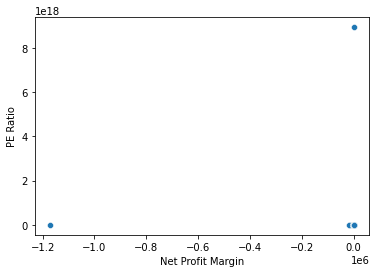

In [4]:
sns.scatterplot(y=df['PE Ratio'],x=df['Net Profit Margin'])
#plt.xlim(-1.175e+6, -1.170e+6)

<AxesSubplot:xlabel='Debt to Equity', ylabel='Return on Equity'>

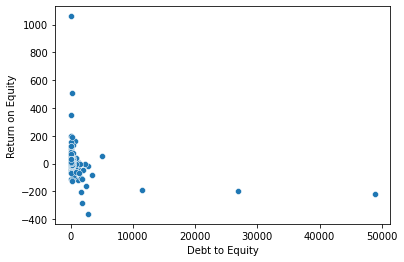

In [5]:
sns.scatterplot(x=df['Debt to Equity'],y=df['Return on Equity'])

#### Removing Outliners

In [6]:
df[(df['Debt to Equity'] > 5000) | (df['Return on Equity'] > 600) | ( (df['PE Ratio'] > 5000) | (df['PE Ratio'] < -3000) ) | ( (df['Net Profit Margin'] < -5000) |(df['Net Profit Margin'] > 1000) ) ].shape

(23, 44)

In [7]:
df = df.drop(df[(df['Debt to Equity'] > 5000) | (df['Return on Equity'] > 600) |  ( (df['PE Ratio'] > 5000) | (df['PE Ratio'] < -3000) )  | ( (df['Net Profit Margin'] < -5000) |(df['Net Profit Margin'] > 1000) )].index,axis=0)

<AxesSubplot:xlabel='Net Profit Margin', ylabel='PE Ratio'>

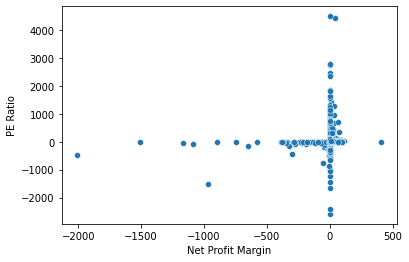

In [8]:
sns.scatterplot(y=df['PE Ratio'],x=df['Net Profit Margin'])

<AxesSubplot:xlabel='Debt to Equity', ylabel='Return on Equity'>

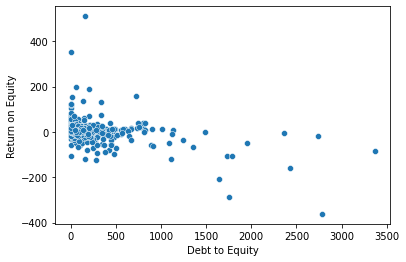

In [9]:
sns.scatterplot(x=df['Debt to Equity'],y=df['Return on Equity'])

In [10]:
pd.set_option('display.max_columns', None)  #for displaying all columns
df.head()

,Name,Ticker,Sub-Sector,Market Cap,Close Price,PE Ratio,Return on Equity,Return on Assets,Net Profit Margin,5Y Avg EBITDA Margin,EBITDA Margin,1Y Return vs Nifty,5Y CAGR,Debt to Equity,Long Term Debt to Equity,Net Income / Liabilities,5Y Historical Revenue Growth,5Y Historical EBITDA Growth,5Y Hist Op. Cash Flow Growth,5Y Historical EPS Growth,Forward PE Ratio,Enterprise Value,PB Ratio,Dividend Yield,PE Premium vs Sector,Domestic Institutional Holding,Mutual Fund Holding,Promoter Holding,Foreign Institutional Holding,Retail Investor Holding,Pledged Promoter Holdings,Insurance Firms Holding,No. of Shareholders,Total Revenue,Net Income,PBT,Earnings Per Share,EBITDA,Long Term Investments,Reserves & Surplus,Cash and Equivalent,Book Value,Free Cash Flow,Operating Cash Flow
0,Reliance Industries Ltd,RELIANCE,Oil & Gas - Refining & Marketing,1.679534e+06,2467.40,34.186904,7.793277,3.957021,9.725370,17.720494,20.433809,2.412295,31.316180,33.855037,22.831210,9.436206,12.027323,13.837923,-7.242712,8.340978,25.088855,1.879599e+06,2.100909,0.281831,87.531277,13.620915,4.817100,50.614606,24.748871,7.651335,0.000000,6.364201,3306662.0,505153.00,49128.00,55461.00,74.653049,103222.00,212382.00,579376.00,169843.00,799432.00,-79652.00,26185.00
1,Tata Consultancy Services Ltd,TCS,IT Services & Consulting,1.358569e+06,3626.70,41.892356,37.740680,25.932382,19.383065,29.072528,28.965220,2.801648,23.874994,8.948661,7.465445,75.622610,8.410398,7.497213,15.218769,7.100835,35.213843,1.328550e+06,15.596376,1.034647,8.064689,7.930064,3.323000,72.186191,14.978488,3.601120,0.341522,4.459817,1577358.0,167311.00,32430.00,43760.00,87.043624,48462.00,213.00,86063.00,38489.00,87108.00,35727.00,38802.00
2,HDFC Bank Ltd,HDFCBANK,Private Banks,8.206363e+05,1486.50,25.779258,16.435200,1.883433,20.420916,28.206116,28.342094,-16.833310,15.587857,NaN,NaN,2.003268,15.951858,16.887116,NaN,17.890164,21.351484,6.999965e+05,3.899566,0.436650,-2.287745,22.978635,14.983198,25.798684,37.465455,9.776550,0.000000,2.887513,1888276.0,155885.27,31833.20,42796.14,57.899268,44181.15,438823.11,148746.23,121272.52,210442.95,40780.31,42476.46
3,Infosys Ltd,INFY,IT Services & Consulting,7.775010e+05,1853.05,40.178853,27.135305,19.417895,18.847214,28.656802,29.306634,21.730844,29.114535,6.935219,5.974056,62.973087,9.386100,8.297508,18.289049,9.098144,33.954239,7.562010e+05,10.126084,1.474197,3.644571,16.303165,12.791069,13.117747,33.174470,6.272681,0.000000,3.195299,1897185.0,102673.00,19351.00,26628.00,45.607423,30090.00,11863.00,73627.00,27056.00,76782.00,21117.00,23224.00
4,ICICI Bank Ltd,ICICIBANK,Private Banks,5.002790e+05,710.75,27.212283,12.382897,1.243333,11.395012,11.900543,16.963554,5.055258,23.506987,NaN,NaN,1.303950,9.734319,12.559350,42.310320,11.494489,21.914511,3.622968e+05,2.992532,0.276496,3.143912,43.758893,28.200160,0.000000,45.294421,6.799743,0.000000,12.664458,1642131.0,161336.47,18384.31,26028.33,27.461218,27368.40,536578.62,107231.52,147570.54,167175.84,136327.09,138015.30


In [11]:
df['Sub-Sector'].fillna("None",inplace=True)

In [12]:
#Plot the sub-sector vs no. of companies
plt.figure(figsize=(25,10),dpi=700)
sns.countplot(df['Sub-Sector'],order=df['Sub-Sector'].value_counts().index )
plt.xticks(rotation=90);
plt.xlabel("Sub-Sector", fontsize=20);
plt.ylabel("Number of Companies",fontsize=20)
plt.title("Sub-Sector vs Number of Companies",fontsize=20)

/home/shailja/.virtualenv/mlearning/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Sub-Sector vs Number of Companies')

In [13]:
#made a pandas series of the Sub-Sector column and its value_counts()
sub_sectors = df.groupby('Sub-Sector').count()['Name'].sort_values(ascending=False) 

In [14]:
#filtered the dataframe to only include those which are in more than 60 Companies 
sectors_appeared_frequently = sub_sectors[sub_sectors.values > 60]

/home/shailja/.virtualenv/mlearning/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Sub-Sector vs Number of Companies')

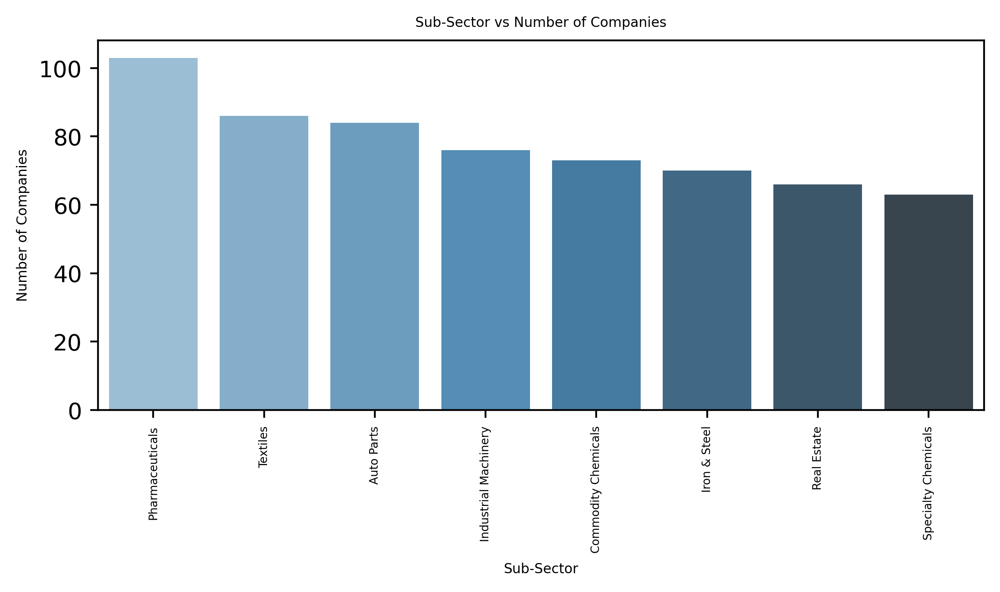

In [15]:
plt.figure(figsize=(7,3),dpi=400)
sns.barplot(sectors_appeared_frequently.index,sectors_appeared_frequently.values,palette='Blues_d')
#plt.xticks(rotation=90);
plt.xlabel("Sub-Sector", fontsize=6);
plt.xticks(rotation=90,fontsize=5);
plt.ylabel("Number of Companies",fontsize=6)
plt.title("Sub-Sector vs Number of Companies",fontsize=6)

In [16]:
top_most = df[df['Sub-Sector'].isin(sectors_appeared_frequently.index)]
top_most.head()

,Name,Ticker,Sub-Sector,Market Cap,Close Price,PE Ratio,Return on Equity,Return on Assets,Net Profit Margin,5Y Avg EBITDA Margin,EBITDA Margin,1Y Return vs Nifty,5Y CAGR,Debt to Equity,Long Term Debt to Equity,Net Income / Liabilities,5Y Historical Revenue Growth,5Y Historical EBITDA Growth,5Y Hist Op. Cash Flow Growth,5Y Historical EPS Growth,Forward PE Ratio,Enterprise Value,PB Ratio,Dividend Yield,PE Premium vs Sector,Domestic Institutional Holding,Mutual Fund Holding,Promoter Holding,Foreign Institutional Holding,Retail Investor Holding,Pledged Promoter Holdings,Insurance Firms Holding,No. of Shareholders,Total Revenue,Net Income,PBT,Earnings Per Share,EBITDA,Long Term Investments,Reserves & Surplus,Cash and Equivalent,Book Value,Free Cash Flow,Operating Cash Flow
23,Sun Pharmaceutical Industries Ltd,SUNPHARMA,Pharmaceuticals,218723.375865,913.80,75.322636,5.889831,4.276092,8.451826,22.063768,14.613338,41.916119,5.534128,7.818499,1.815144,16.005719,3.345170,-9.192723,-1.591914,-9.830065,68.715239,216033.435865,4.420455,0.822729,104.863487,20.996896,11.795563,54.479035,12.995538,5.386161,2.607961,8.673597,680800.0,34357.31,2903.82,2799.37,12.102604,5020.75,6482.39,45035.44,9575.57,49479.83,5000.24,6170.37
29,JSW Steel Ltd,JSWSTEEL,Iron & Steel,164987.679727,681.30,20.855477,19.243727,5.647951,9.835638,21.264829,25.675104,38.548848,28.773549,135.076130,111.853761,7.744797,14.025785,35.893167,22.192530,NaN,10.005216,213913.679727,3.573405,1.188118,-14.390982,8.372893,2.396417,44.722110,11.212986,4.231309,7.962185,0.000000,679906.0,80432.00,7911.00,12015.00,26.249786,20651.00,8573.00,41045.00,12821.00,46171.00,9531.00,18789.00
30,Tata Steel Ltd,TATASTEEL,Iron & Steel,159191.559448,1302.95,21.253256,9.748362,3.038269,4.749945,16.060095,19.458375,61.657046,21.288380,114.182918,93.420511,4.501314,7.606884,25.847220,31.078471,NaN,4.714605,237961.579448,2.053861,1.891615,-12.758154,18.105472,10.367514,33.920908,21.364409,16.025276,0.525565,7.540167,1691278.0,157690.66,7490.22,13843.69,62.214976,30684.04,3463.04,41299.78,13001.07,77508.45,37348.09,44326.68
51,DLF Ltd,DLF,Real Estate,89866.191486,353.90,82.173893,3.127747,1.999687,18.395799,41.906471,31.159870,7.039731,19.008278,18.506464,9.007845,6.067780,-10.917612,-16.160496,-13.160992,20.800824,54.870154,94325.991486,2.533982,0.550888,-9.909763,3.424072,2.627697,74.949303,16.456390,2.263777,0.000000,0.032150,385547.0,5944.89,1093.61,839.58,4.418070,1852.42,19028.70,9777.72,2123.69,35464.42,1446.67,1460.18
54,Cipla Ltd,CIPLA,Pharmaceuticals,84594.451675,1050.30,35.176310,13.883780,9.962577,12.379913,20.663582,23.260155,21.980522,12.155440,9.445813,6.471411,38.357080,6.772565,10.946944,16.620887,11.987174,28.530911,82921.471675,4.551615,0.476664,-4.327014,21.520925,13.153066,36.107465,24.360143,7.936384,0.000000,4.344319,451365.0,19425.58,2404.87,3290.06,29.824172,4518.42,423.68,16551.93,3687.60,18585.59,2936.28,3755.20


#### Exploring in Pharmaceuticals Sector

In [17]:
pharma = top_most[top_most['Sub-Sector'] == 'Pharmaceuticals']
pharma.head()

,Name,Ticker,Sub-Sector,Market Cap,Close Price,PE Ratio,Return on Equity,Return on Assets,Net Profit Margin,5Y Avg EBITDA Margin,EBITDA Margin,1Y Return vs Nifty,5Y CAGR,Debt to Equity,Long Term Debt to Equity,Net Income / Liabilities,5Y Historical Revenue Growth,5Y Historical EBITDA Growth,5Y Hist Op. Cash Flow Growth,5Y Historical EPS Growth,Forward PE Ratio,Enterprise Value,PB Ratio,Dividend Yield,PE Premium vs Sector,Domestic Institutional Holding,Mutual Fund Holding,Promoter Holding,Foreign Institutional Holding,Retail Investor Holding,Pledged Promoter Holdings,Insurance Firms Holding,No. of Shareholders,Total Revenue,Net Income,PBT,Earnings Per Share,EBITDA,Long Term Investments,Reserves & Surplus,Cash and Equivalent,Book Value,Free Cash Flow,Operating Cash Flow
23,Sun Pharmaceutical Industries Ltd,SUNPHARMA,Pharmaceuticals,218723.375865,913.80,75.322636,5.889831,4.276092,8.451826,22.063768,14.613338,41.916119,5.534128,7.818499,1.815144,16.005719,3.345170,-9.192723,-1.591914,-9.830065,68.715239,216033.435865,4.420455,0.822729,104.863487,20.996896,11.795563,54.479035,12.995538,5.386161,2.607961,8.673597,680800.0,34357.31,2903.82,2799.37,12.102604,5020.75,6482.39,45035.44,9575.57,49479.83,5000.24,6170.37
54,Cipla Ltd,CIPLA,Pharmaceuticals,84594.451675,1050.30,35.176310,13.883780,9.962577,12.379913,20.663582,23.260155,21.980522,12.155440,9.445813,6.471411,38.357080,6.772565,10.946944,16.620887,11.987174,28.530911,82921.471675,4.551615,0.476664,-4.327014,21.520925,13.153066,36.107465,24.360143,7.936384,0.000000,4.344319,451365.0,19425.58,2404.87,3290.06,29.824172,4518.42,423.68,16551.93,3687.60,18585.59,2936.28,3755.20
71,Dr Reddy's Laboratories Ltd,DRREDDY,Pharmaceuticals,67080.243216,4004.95,34.371922,11.742302,7.835989,10.066591,19.451733,21.712084,-22.403657,8.830715,17.179750,3.570518,21.814849,4.093345,1.640997,1.818847,-1.241509,23.457297,66653.743216,3.802368,0.619785,-6.514798,22.285670,12.465432,26.716716,27.421923,8.161228,0.000000,9.374749,242376.0,19386.90,1951.60,2883.50,117.398826,4209.30,833.30,17124.40,3457.30,17641.70,2314.20,3570.30
88,Gland Pharma Ltd,GLAND,Pharmaceuticals,54222.363131,3282.65,54.387156,20.880090,18.842538,27.711624,38.838359,39.942907,12.413394,NaN,0.068945,0.066574,168.168477,21.042330,21.667845,22.395578,25.478080,45.067119,51220.683131,9.185187,NaN,47.922897,11.657008,10.551881,57.998999,11.298036,2.973205,0.000000,0.651021,109097.0,3597.66,996.97,1334.82,62.595746,1437.01,0.00,4046.77,3005.75,5903.24,376.15,604.93
97,Torrent Pharmaceuticals Ltd,TORNTPHARM,Pharmaceuticals,48644.763091,2763.60,38.857369,23.486570,8.915130,15.529158,26.924028,31.536765,-1.626049,13.911683,82.667800,50.385204,15.197366,3.123092,-1.664960,-6.016474,-6.298189,39.090810,52727.673091,8.333621,1.217561,5.684779,8.939908,6.732488,71.246178,11.632225,4.407505,0.000000,0.042547,67205.0,8061.48,1251.88,1526.26,73.978246,2542.33,42.09,5748.21,742.55,5837.17,1675.54,2010.69


/tmp/ipykernel_15238/3798769923.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(data[axis_x], rotation=90);


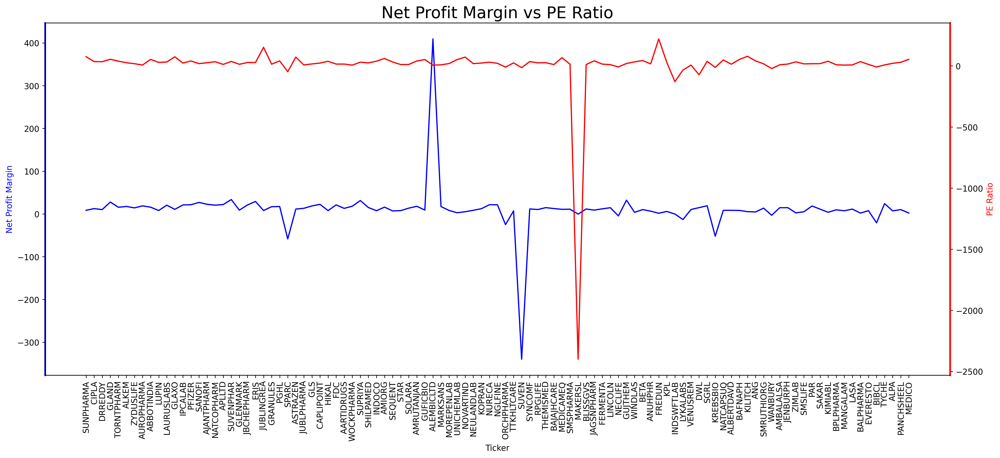

In [18]:
plot_DE_RE(data =pharma, axis_x='Ticker' , axis_y1='Net Profit Margin', axis_y2='PE Ratio' )

/tmp/ipykernel_15238/3798769923.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(data[axis_x], rotation=90);


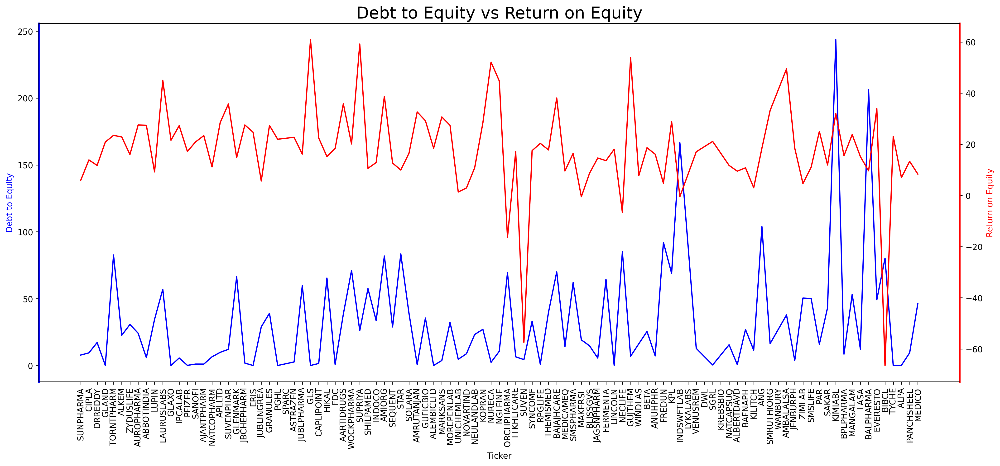

In [19]:
plot_DE_RE(data =pharma, axis_x='Ticker' , axis_y1='Debt to Equity', axis_y2='Return on Equity' )

#### Exploring in Textiles Sector

In [20]:
textile = top_most[top_most['Sub-Sector'] == 'Textiles']
textile.head()

,Name,Ticker,Sub-Sector,Market Cap,Close Price,PE Ratio,Return on Equity,Return on Assets,Net Profit Margin,5Y Avg EBITDA Margin,EBITDA Margin,1Y Return vs Nifty,5Y CAGR,Debt to Equity,Long Term Debt to Equity,Net Income / Liabilities,5Y Historical Revenue Growth,5Y Historical EBITDA Growth,5Y Hist Op. Cash Flow Growth,5Y Historical EPS Growth,Forward PE Ratio,Enterprise Value,PB Ratio,Dividend Yield,PE Premium vs Sector,Domestic Institutional Holding,Mutual Fund Holding,Promoter Holding,Foreign Institutional Holding,Retail Investor Holding,Pledged Promoter Holdings,Insurance Firms Holding,No. of Shareholders,Total Revenue,Net Income,PBT,Earnings Per Share,EBITDA,Long Term Investments,Reserves & Surplus,Cash and Equivalent,Book Value,Free Cash Flow,Operating Cash Flow
58,SRF Ltd,SRF,Textiles,76719.689691,2605.45,64.043015,20.321737,10.077829,14.149360,21.233616,25.977660,129.016258,52.063329,50.588937,29.590369,19.784801,12.875771,17.300818,10.201568,22.355213,43.332117,79493.759690,11.189468,0.188526,105.294772,9.156784,8.969149,50.732737,19.090087,10.456903,0.0,0.175075,208610.0,8466.39,1197.94,1612.34,40.346327,2199.37,4.16,6057.39,694.52,6856.42,557.33,1771.68
173,Trident Ltd,TRIDENT,Textiles,27314.655121,52.85,89.735718,9.587509,5.271676,6.693877,19.226127,17.755630,248.384007,45.696736,46.938395,8.428276,12.457998,4.215654,1.135260,-1.047593,4.654683,33.705714,28758.315121,8.206739,0.671634,107.418923,0.019827,0.017010,72.942723,2.476897,17.347996,0.0,0.002817,1561150.0,4547.29,304.39,398.44,0.597317,807.40,1.40,2485.35,118.60,3328.32,171.49,504.93
204,Vedant Fashions Ltd,MANYAVAR,Textiles,21855.877873,912.20,164.441185,12.321141,8.267990,21.264920,38.025290,48.521647,-16.098752,NaN,26.769042,20.289350,24.950253,4.310513,14.766333,24.109839,7.010276,NaN,21685.337873,20.025360,NaN,113.595216,6.465564,4.872688,84.908057,5.850631,1.697931,0.0,0.000000,93696.0,625.02,132.91,181.92,10.668616,303.27,79.98,936.73,462.70,1091.41,240.12,252.62
208,KPR Mill Ltd,KPRMILL,Textiles,21198.640750,627.60,41.141639,24.442842,16.800678,14.437138,20.575561,24.331814,164.079819,37.348393,27.972445,7.619874,57.174244,6.341487,11.967910,26.330737,21.778377,25.136517,21545.340750,9.020046,0.146068,103.401395,12.996249,12.996249,74.717412,3.575372,5.900690,0.0,0.000000,95536.0,3568.99,515.26,688.86,14.976312,868.40,1.50,2124.80,310.70,2350.17,373.92,658.92
262,Vardhman Textiles Ltd,VTL,Textiles,15251.732976,2604.35,37.207516,6.417086,4.317567,6.443039,19.396583,16.284505,92.007844,14.392864,32.273459,19.626854,13.550206,1.118352,-4.939162,-28.720448,-6.149731,9.375893,16798.092976,2.308396,0.648965,103.076141,18.843332,18.001023,63.145220,6.301223,7.857706,0.0,0.667216,57311.0,6362.06,409.91,558.90,72.502723,1036.03,566.86,6392.77,719.17,6607.07,-74.64,168.38


/tmp/ipykernel_15238/3798769923.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(data[axis_x], rotation=90);


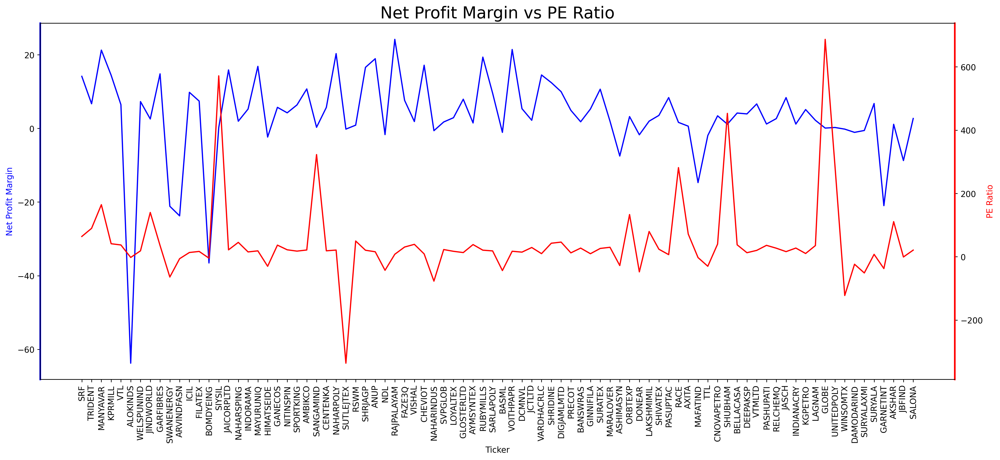

In [21]:
plot_DE_RE(data =textile, axis_x='Ticker' , axis_y1='Net Profit Margin', axis_y2='PE Ratio' )

/tmp/ipykernel_15238/3798769923.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(data[axis_x], rotation=90);


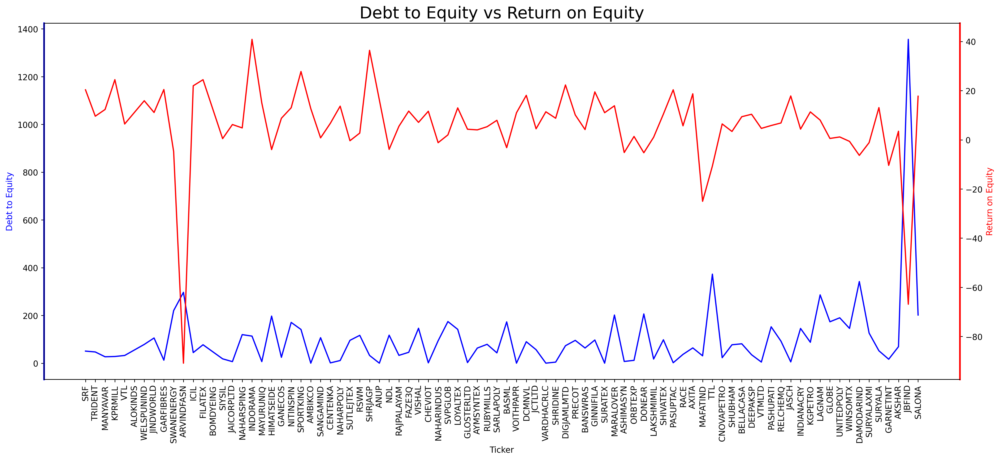

In [22]:
plot_DE_RE(data =textile, axis_x='Ticker' , axis_y1='Debt to Equity', axis_y2='Return on Equity' )

### Small_Cap

In [23]:
small_cap = top_most[top_most['Market Cap'] < 5000]
small_cap.head()

,Name,Ticker,Sub-Sector,Market Cap,Close Price,PE Ratio,Return on Equity,Return on Assets,Net Profit Margin,5Y Avg EBITDA Margin,EBITDA Margin,1Y Return vs Nifty,5Y CAGR,Debt to Equity,Long Term Debt to Equity,Net Income / Liabilities,5Y Historical Revenue Growth,5Y Historical EBITDA Growth,5Y Hist Op. Cash Flow Growth,5Y Historical EPS Growth,Forward PE Ratio,Enterprise Value,PB Ratio,Dividend Yield,PE Premium vs Sector,Domestic Institutional Holding,Mutual Fund Holding,Promoter Holding,Foreign Institutional Holding,Retail Investor Holding,Pledged Promoter Holdings,Insurance Firms Holding,No. of Shareholders,Total Revenue,Net Income,PBT,Earnings Per Share,EBITDA,Long Term Investments,Reserves & Surplus,Cash and Equivalent,Book Value,Free Cash Flow,Operating Cash Flow
507,Mahindra Lifespace Developers Ltd,MAHLIFE,Real Estate,4917.349619,319.55,-68.534489,-4.200463,-2.805814,-35.887561,1.774037,-29.925474,66.605650,20.305065,14.643054,4.495302,NaN,-21.829333,NaN,NaN,NaN,206.073154,5068.819619,2.939100,NaN,-175.136861,17.376527,17.030916,51.342900,10.612434,9.496868,0.0,0.007856,70851.0,199.93,-71.75,-77.79,-4.655470,-59.83,558.05,553.62,135.50,1673.08,-71.74,-68.02
512,Ingersoll-Rand (India) Ltd,INGERRAND,Industrial Machinery,4805.596640,1566.15,66.412336,17.398413,11.818798,11.471511,19.030358,19.616982,111.456642,17.509029,2.116848,1.333570,32.651956,-1.212430,6.243723,2.758087,3.528965,NaN,4583.776640,10.663227,0.197070,10.632128,4.985124,4.953605,75.000000,0.434963,13.071205,0.0,0.000158,27969.0,630.78,72.36,107.79,22.921946,123.74,0.00,419.10,231.36,450.67,69.82,76.50
516,Minda Corporation Ltd,MINDACORP,Auto Parts,4675.360668,197.75,88.548498,4.977376,2.268577,2.195426,8.301394,8.997921,93.938423,16.499545,46.023025,10.736089,4.468895,-0.584455,-3.458499,-17.650429,-15.202788,56.553559,4703.660668,4.077586,0.332384,107.320769,13.004062,3.471337,64.726890,5.144604,6.552817,0.0,4.535522,75060.0,2405.00,52.80,84.00,2.264628,216.40,180.50,612.20,499.40,1146.60,-49.50,85.50
518,Kennametal India Ltd,KENNAMET,Industrial Machinery,4651.804387,2196.75,63.462543,12.843876,9.928886,8.517314,12.925578,15.884267,82.235484,NaN,0.000000,0.000000,38.256785,8.242062,20.051032,56.932293,28.723857,NaN,4522.904387,7.942299,0.944934,5.718253,12.865216,12.748077,75.000000,0.638163,8.935124,0.0,0.000000,10440.0,860.60,73.30,98.50,33.351169,136.70,0.00,563.60,128.90,585.70,139.70,166.00
529,F D C Ltd,FDC,Pharmaceuticals,4423.668251,263.70,14.679503,18.367216,15.990343,21.069890,26.223106,29.992169,-19.239248,5.200954,0.838543,0.403700,135.578351,6.726801,9.924201,3.507018,13.735881,15.404315,3881.618251,2.551194,NaN,-60.074496,5.453964,5.250770,69.355717,4.472357,11.059628,0.0,0.059786,53582.0,1430.24,301.35,387.72,17.737783,428.96,265.36,1717.25,556.42,1733.96,144.54,207.08


In [24]:
small_cap.shape[0]  #no. of Small Cap companies in top_most Sector

505

/tmp/ipykernel_15238/3798769923.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(data[axis_x], rotation=90);


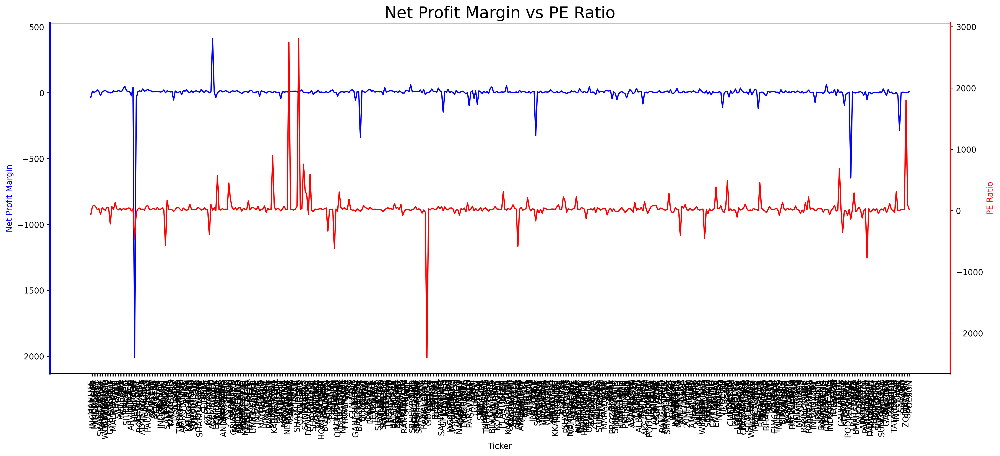

In [25]:
plot_DE_RE(data =small_cap, axis_x='Ticker' , axis_y1='Net Profit Margin', axis_y2='PE Ratio' )

### Large_Cap

In [26]:
large_cap = top_most[top_most['Market Cap'] > 20000]
large_cap.head()

,Name,Ticker,Sub-Sector,Market Cap,Close Price,PE Ratio,Return on Equity,Return on Assets,Net Profit Margin,5Y Avg EBITDA Margin,EBITDA Margin,1Y Return vs Nifty,5Y CAGR,Debt to Equity,Long Term Debt to Equity,Net Income / Liabilities,5Y Historical Revenue Growth,5Y Historical EBITDA Growth,5Y Hist Op. Cash Flow Growth,5Y Historical EPS Growth,Forward PE Ratio,Enterprise Value,PB Ratio,Dividend Yield,PE Premium vs Sector,Domestic Institutional Holding,Mutual Fund Holding,Promoter Holding,Foreign Institutional Holding,Retail Investor Holding,Pledged Promoter Holdings,Insurance Firms Holding,No. of Shareholders,Total Revenue,Net Income,PBT,Earnings Per Share,EBITDA,Long Term Investments,Reserves & Surplus,Cash and Equivalent,Book Value,Free Cash Flow,Operating Cash Flow
23,Sun Pharmaceutical Industries Ltd,SUNPHARMA,Pharmaceuticals,218723.375865,913.80,75.322636,5.889831,4.276092,8.451826,22.063768,14.613338,41.916119,5.534128,7.818499,1.815144,16.005719,3.345170,-9.192723,-1.591914,-9.830065,68.715239,216033.435865,4.420455,0.822729,104.863487,20.996896,11.795563,54.479035,12.995538,5.386161,2.607961,8.673597,680800.0,34357.31,2903.82,2799.37,12.102604,5020.75,6482.39,45035.44,9575.57,49479.83,5000.24,6170.37
29,JSW Steel Ltd,JSWSTEEL,Iron & Steel,164987.679727,681.30,20.855477,19.243727,5.647951,9.835638,21.264829,25.675104,38.548848,28.773549,135.076130,111.853761,7.744797,14.025785,35.893167,22.192530,NaN,10.005216,213913.679727,3.573405,1.188118,-14.390982,8.372893,2.396417,44.722110,11.212986,4.231309,7.962185,0.000000,679906.0,80432.00,7911.00,12015.00,26.249786,20651.00,8573.00,41045.00,12821.00,46171.00,9531.00,18789.00
30,Tata Steel Ltd,TATASTEEL,Iron & Steel,159191.559448,1302.95,21.253256,9.748362,3.038269,4.749945,16.060095,19.458375,61.657046,21.288380,114.182918,93.420511,4.501314,7.606884,25.847220,31.078471,NaN,4.714605,237961.579448,2.053861,1.891615,-12.758154,18.105472,10.367514,33.920908,21.364409,16.025276,0.525565,7.540167,1691278.0,157690.66,7490.22,13843.69,62.214976,30684.04,3463.04,41299.78,13001.07,77508.45,37348.09,44326.68
51,DLF Ltd,DLF,Real Estate,89866.191486,353.90,82.173893,3.127747,1.999687,18.395799,41.906471,31.159870,7.039731,19.008278,18.506464,9.007845,6.067780,-10.917612,-16.160496,-13.160992,20.800824,54.870154,94325.991486,2.533982,0.550888,-9.909763,3.424072,2.627697,74.949303,16.456390,2.263777,0.000000,0.032150,385547.0,5944.89,1093.61,839.58,4.418070,1852.42,19028.70,9777.72,2123.69,35464.42,1446.67,1460.18
54,Cipla Ltd,CIPLA,Pharmaceuticals,84594.451675,1050.30,35.176310,13.883780,9.962577,12.379913,20.663582,23.260155,21.980522,12.155440,9.445813,6.471411,38.357080,6.772565,10.946944,16.620887,11.987174,28.530911,82921.471675,4.551615,0.476664,-4.327014,21.520925,13.153066,36.107465,24.360143,7.936384,0.000000,4.344319,451365.0,19425.58,2404.87,3290.06,29.824172,4518.42,423.68,16551.93,3687.60,18585.59,2936.28,3755.20


In [27]:
large_cap.shape[0]  #no. of large Cap companies in top_most Sector

46

/tmp/ipykernel_15238/3798769923.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(data[axis_x], rotation=90);


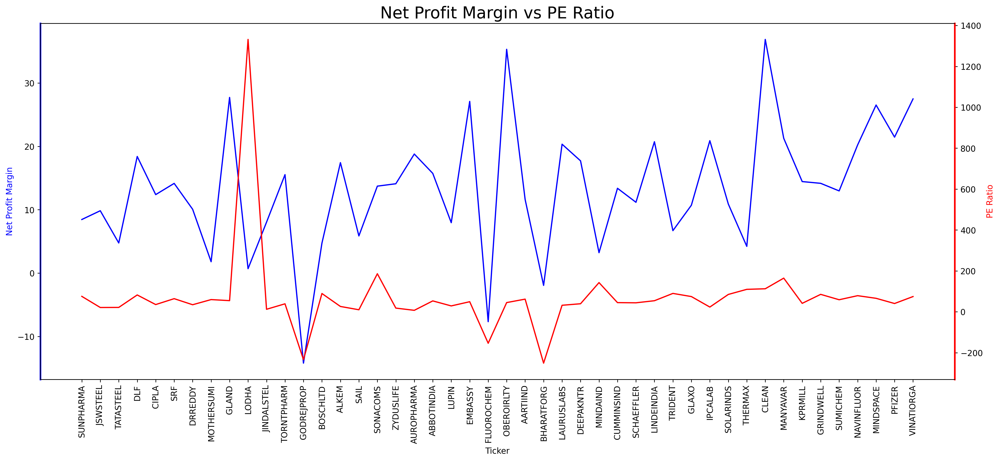

In [28]:
plot_DE_RE(data =large_cap, axis_x='Ticker' , axis_y1='Net Profit Margin', axis_y2='PE Ratio' )

/tmp/ipykernel_15238/3798769923.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(data[axis_x], rotation=90);


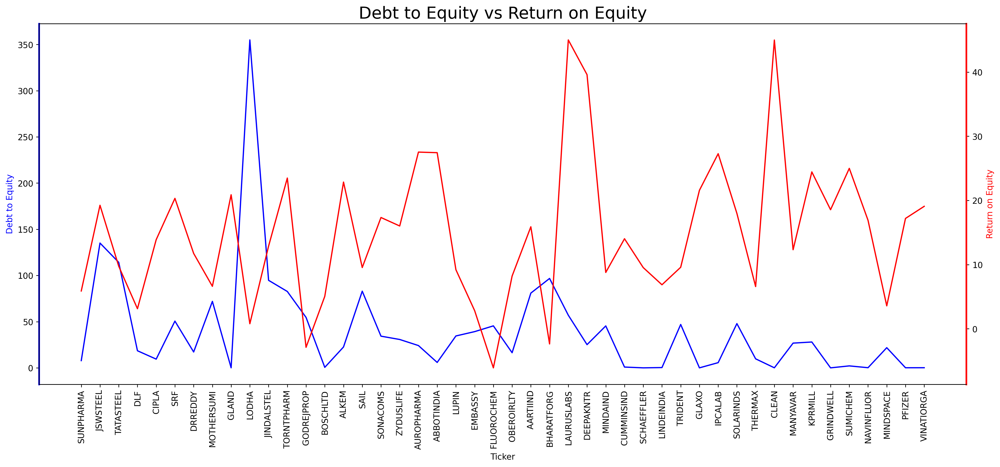

In [29]:
plot_DE_RE(data =large_cap, axis_x='Ticker' , axis_y1='Debt to Equity', axis_y2='Return on Equity' )

### Mid_Cap

In [30]:
mid_cap = top_most[(top_most['Market Cap'] >= 5000) & (top_most['Market Cap'] <= 20000)]
mid_cap.head()

,Name,Ticker,Sub-Sector,Market Cap,Close Price,PE Ratio,Return on Equity,Return on Assets,Net Profit Margin,5Y Avg EBITDA Margin,EBITDA Margin,1Y Return vs Nifty,5Y CAGR,Debt to Equity,Long Term Debt to Equity,Net Income / Liabilities,5Y Historical Revenue Growth,5Y Historical EBITDA Growth,5Y Hist Op. Cash Flow Growth,5Y Historical EPS Growth,Forward PE Ratio,Enterprise Value,PB Ratio,Dividend Yield,PE Premium vs Sector,Domestic Institutional Holding,Mutual Fund Holding,Promoter Holding,Foreign Institutional Holding,Retail Investor Holding,Pledged Promoter Holdings,Insurance Firms Holding,No. of Shareholders,Total Revenue,Net Income,PBT,Earnings Per Share,EBITDA,Long Term Investments,Reserves & Surplus,Cash and Equivalent,Book Value,Free Cash Flow,Operating Cash Flow
233,Prestige Estates Projects Ltd,PRESTIGE,Real Estate,19369.635121,474.80,13.301494,22.706470,5.207577,16.231219,29.512885,40.732980,50.147747,19.097687,53.054147,31.380135,7.579480,9.037892,21.930198,33.612747,17.439467,0.406784,21227.635121,2.676214,0.310430,-85.417087,6.374588,2.943509,65.483939,24.667474,1.816795,0.000000,2.729547,58208.0,8971.60,1456.20,2071.90,36.326747,3654.40,906.70,3418.10,2401.70,7237.70,1100.70,1852.80
239,Sundram Fasteners Ltd,SUNDRMFAST,Auto Parts,18334.750924,883.55,51.046135,16.466063,9.606582,9.782416,17.944495,18.833834,2.586183,18.929486,30.114147,12.064316,22.865328,1.215118,16.079201,-5.268568,23.299340,36.165606,19014.220924,7.774365,0.538651,104.220252,17.482325,11.017583,49.534140,11.731125,16.458001,0.000000,6.344770,65779.0,3671.69,359.18,485.70,17.093361,691.52,61.49,2326.09,41.99,2358.36,260.47,454.04
240,Phoenix Mills Ltd,PHOENIXLTD,Real Estate,17993.865544,1033.95,342.023675,0.940224,0.478326,4.513633,50.544356,50.331166,22.556203,21.277049,65.486365,48.617133,1.002256,-8.423361,-5.518179,-2.566716,-17.869502,92.049260,22762.585544,2.900468,0.095517,274.973030,17.706065,16.751992,47.339228,30.632710,2.853512,0.000000,0.389527,36990.0,1165.58,52.61,29.23,3.234219,586.65,474.95,2406.10,612.94,6203.78,-307.63,436.62
244,Sanofi India Ltd,SANOFI,Pharmaceuticals,17523.194208,7601.00,18.554844,20.941398,15.499197,26.828021,26.898155,37.671155,-17.959283,10.667721,1.066541,0.844738,118.123827,7.665833,17.129996,23.442588,25.429235,13.634309,16337.194208,8.269558,6.440039,-49.534295,19.052416,10.673233,60.396054,9.218622,7.008851,0.000000,8.358806,50916.0,3520.20,944.40,1257.60,410.060000,1326.10,0.00,2094.00,1208.60,2119.00,569.70,611.10
247,Ajanta Pharma Ltd,AJANTPHARM,Pharmaceuticals,16792.266168,1928.15,25.681353,23.375458,18.623708,22.426063,31.876417,35.139093,-9.556412,0.888813,1.046858,0.659961,89.205855,10.491153,10.992868,12.059261,9.659091,22.587894,16438.346169,5.605588,0.493878,-30.151522,12.138414,10.735793,70.340650,8.947262,6.580074,10.811188,0.813526,57897.0,2915.67,653.87,900.18,74.589034,1024.54,0.00,2978.24,385.28,2995.63,404.70,576.31


In [31]:
mid_cap.shape[0]  #no. of Mid Cap companies in top_most Sector

70

/tmp/ipykernel_15238/3798769923.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(data[axis_x], rotation=90);


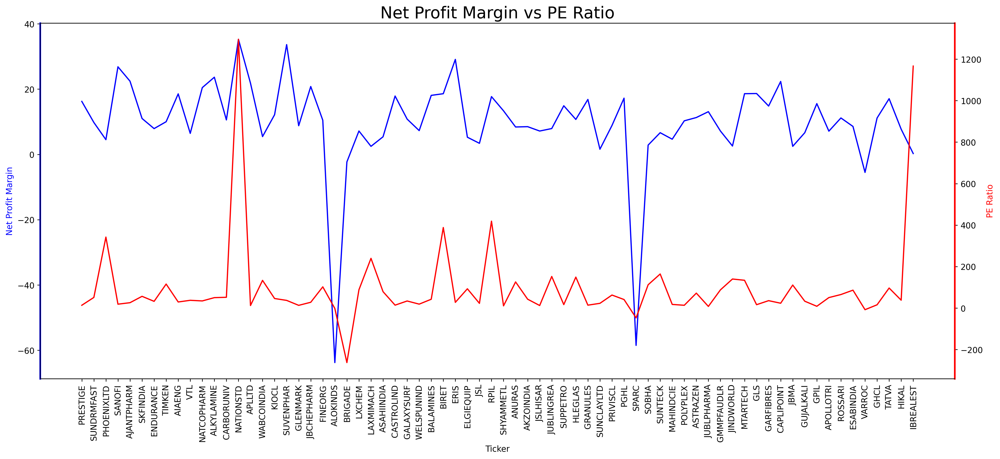

In [32]:
plot_DE_RE(data =mid_cap, axis_x='Ticker' , axis_y1='Net Profit Margin', axis_y2='PE Ratio' )

/tmp/ipykernel_15238/3798769923.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(data[axis_x], rotation=90);


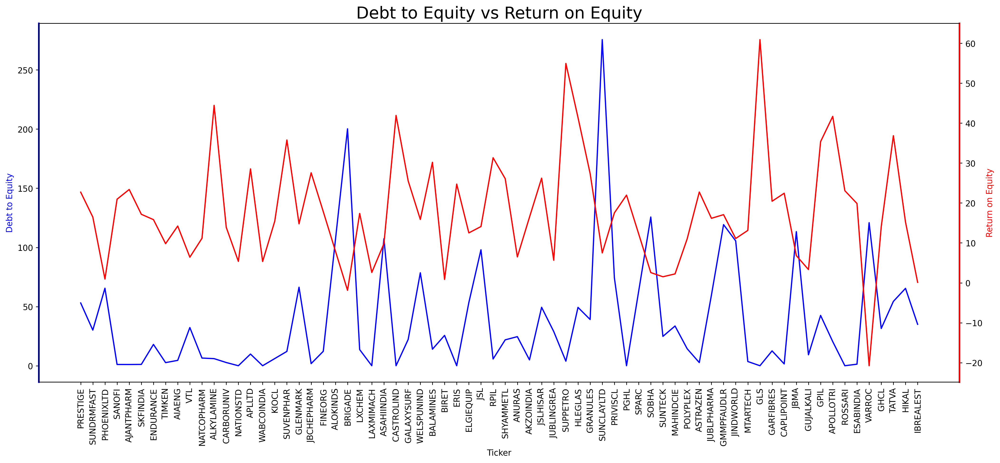

In [33]:
plot_DE_RE(data =mid_cap, axis_x='Ticker' , axis_y1='Debt to Equity', axis_y2='Return on Equity' )

### Random Selected 10 Companies

In [34]:
random_ten = df.sample(n=10)
random_ten.head(3)

,Name,Ticker,Sub-Sector,Market Cap,Close Price,PE Ratio,Return on Equity,Return on Assets,Net Profit Margin,5Y Avg EBITDA Margin,EBITDA Margin,1Y Return vs Nifty,5Y CAGR,Debt to Equity,Long Term Debt to Equity,Net Income / Liabilities,5Y Historical Revenue Growth,5Y Historical EBITDA Growth,5Y Hist Op. Cash Flow Growth,5Y Historical EPS Growth,Forward PE Ratio,Enterprise Value,PB Ratio,Dividend Yield,PE Premium vs Sector,Domestic Institutional Holding,Mutual Fund Holding,Promoter Holding,Foreign Institutional Holding,Retail Investor Holding,Pledged Promoter Holdings,Insurance Firms Holding,No. of Shareholders,Total Revenue,Net Income,PBT,Earnings Per Share,EBITDA,Long Term Investments,Reserves & Surplus,Cash and Equivalent,Book Value,Free Cash Flow,Operating Cash Flow
393,Symphony Ltd,SYMPHONY,Home Electronics & Appliances,7772.922270,1122.45,72.414033,15.253876,9.423394,11.526567,23.878230,17.676431,-26.610591,-4.894151,28.637815,21.694680,23.855454,14.225576,-0.586113,0.029623,-1.939023,63.352985,7632.812270,10.175047,0.450005,105.986848,10.023229,9.535955,73.250339,4.309270,6.306886,0.000000,0.229724,58352.0,931.24,107.34,131.14,15.343711,164.61,159.33,745.23,363.58,763.92,68.99,88.66
707,Kirloskar Brothers Ltd,KIRLOSBROS,Industrial Machinery,2382.267780,301.75,14.787509,15.692730,5.792412,5.815318,6.776538,10.620625,34.437541,4.795053,27.138651,7.588237,10.022895,0.745636,23.635227,26.749304,NaN,NaN,2383.097780,2.151537,1.000000,-75.366419,9.045403,6.353327,65.951874,1.483204,13.473490,0.000000,0.000000,22356.0,2770.27,161.10,182.08,20.287392,294.22,68.04,1047.34,302.21,1107.24,240.69,316.58
1873,Gayatri BioOrganics Ltd,GAYATRIBI,0,157.182343,19.70,-314.364687,NaN,-17.605634,NaN,NaN,NaN,153.395092,3.297612,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,191.852343,-4.765990,NaN,-870.710114,0.652763,0.652763,68.396001,23.487024,5.788874,19.038398,0.000000,23278.0,0.00,-0.50,-0.50,-0.063461,-0.50,0.00,-114.76,0.44,-32.98,-0.52,-0.52


In [35]:
df['Intrinsic Value'] = (df['Earnings Per Share'] * (8.5 + 2*df['5Y Historical EPS Growth'])*6) 


/tmp/ipykernel_15238/3798769923.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(data[axis_x], rotation=90);


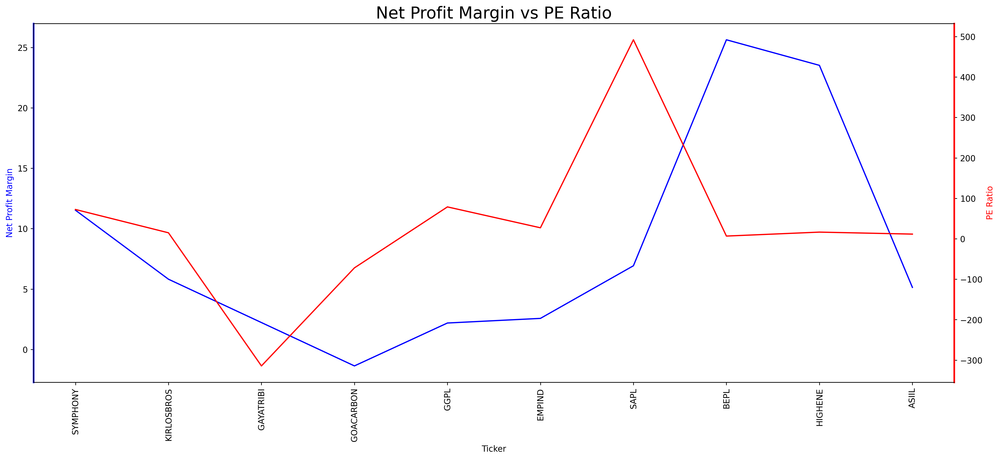

In [38]:
plot_DE_RE(data =random_ten, axis_x='Ticker' , axis_y1='Net Profit Margin', axis_y2='PE Ratio' );

/tmp/ipykernel_15238/3798769923.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(data[axis_x], rotation=90);


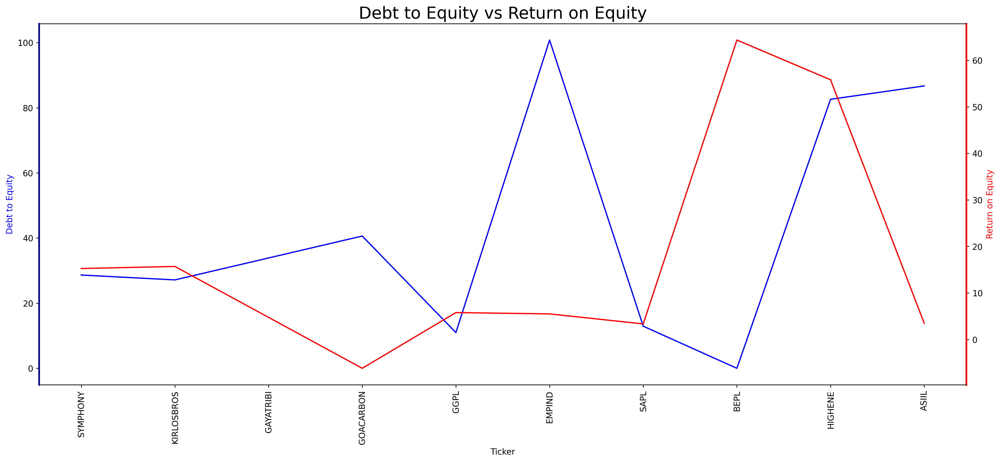

In [37]:
plot_DE_RE(data =random_ten, axis_x='Ticker' , axis_y1='Debt to Equity', axis_y2='Return on Equity' );